# Pothole Detection

## Problem Statement

### Objective

The objective of this project is to build and train a model that can detect presence of potholes given a street-level image

### Approach
We will use YOLOv11 model and finetune it against a bunch of images with potholes.

The image dataset is sourced from [Roboflow](https://public.roboflow.com/object-detection/pothole) under applicable license.
The dataset is split to 70/20/10 train-valid-test images.

We will verify the train and test performances and discuss next steps


### YOLOv11

YOLO11 is the latest offerings in the Ultralytics YOLO series that can be used for various tasks like object detection, instance segmentation, object segmentation, etc. It si based on previous YOLO versions and has better accuracy and efficiency.

For more details: please see [YOLOv11](https://docs.ultralytics.com/models/yolo11)

We will work with YOLOv11n model in this project for detecting potholes in given images

### Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Import libraries

In [2]:
#install ultralytics module to use YOLOv11
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 896.9/896.9 kB 47.0 MB/s eta 0:00:00


In [3]:
import os
import sys
import random

import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib.pyplot as plt

#For YOLOV11 model
from ultralytics import YOLO
import yaml
from PIL import Image
import cv2

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

## Explore Dataset
The Image Dataset from Roboflow is provided with train, valid and test directories and YAML configuration file as below:

Each directory has 2 subdirectories - images and labels

* images subdirectory: Contains street level images
* labels subdirectory: Contains the bounding box coordinates and details

The YAML (Yet Another Markup Language) file contains the configuration specifying the paths to the above directories.

We will explore few sample images below.

In [5]:
DATASET_PATH = "/content/drive/My Drive/DS_ML/CV_Pothole/Pothole_yolov11"

DATA_PATH = os.path.join(DATASET_PATH, "data.yaml")

In [6]:
# Load and print the contents of the YAML file
with open(DATA_PATH, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- pothole
nc: 1
roboflow:
  license: ODbL v1.0
  project: pothole-voxrl
  url: https://universe.roboflow.com/brad-dwyer/pothole-voxrl/dataset/1
  version: 1
  workspace: brad-dwyer
test: ../test/images
train: ../train/images
val: ../valid/images



### Display few train images

In [7]:
# Set paths for training and validation image sets
train_images_path = os.path.join(DATASET_PATH, 'train', 'images')
valid_images_path = os.path.join(DATASET_PATH, 'valid', 'images')

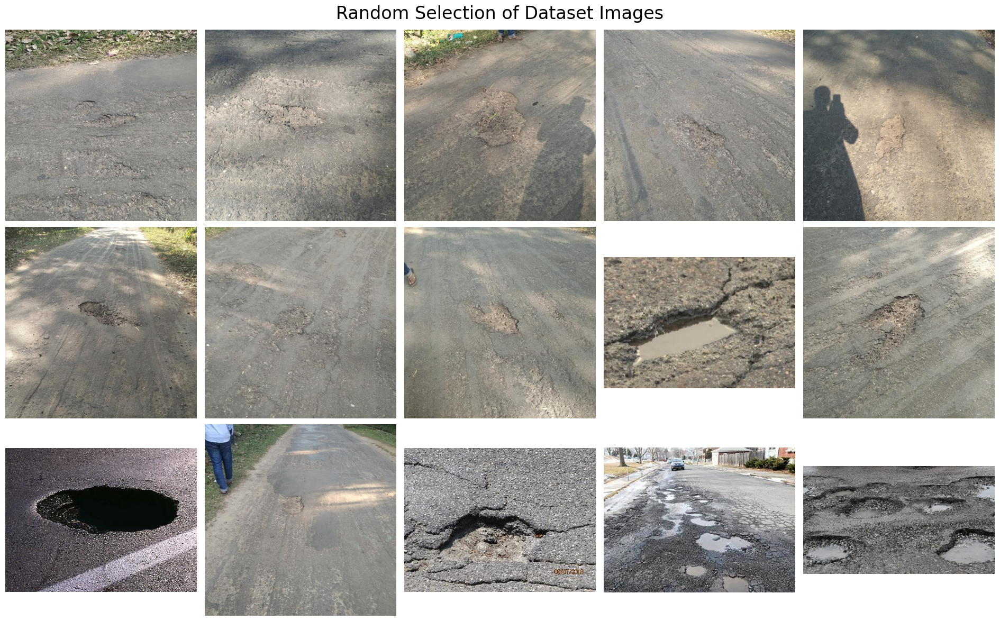

In [8]:
# Set the seed for the random number generator
random.seed(0)

# Create a list of image files
image_files = [f for f in os.listdir(train_images_path) if f.endswith('.jpg')]

# Randomly select 15 images
random_images = random.sample(image_files, 15)

# Create a new figure
plt.figure(figsize=(19, 12))

# Loop through each image and display it in a 3x5 grid
for i, image_file in enumerate(random_images):
    image_path = os.path.join(train_images_path, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

# Add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()

# Deleting unnecessary variable to free up memory
del image_files

## Load YOLO model

In [9]:
model = YOLO("yolo11n.pt")

100%|██████████| 5.35M/5.35M [00:00<00:00, 219MB/s]


### Fine tune the model

In [10]:
# Train the model on our custom dataset
results = model.train(
    data=DATA_PATH,     # Path to the dataset configuration file
    epochs=50,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    patience=5,             # Epochs to wait for no observable improvement for early stopping of training
    batch=16,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate
    lrf=0.01,                # Final learning rate (lr0 * lrf)
    dropout=0.25,            # Use dropout regularization
    device=0,                # Device to run on, i.e. cuda device=0
    seed=42                  # Random seed for reproducibility
)

Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/My Drive/DS_ML/CV_Pothole/Pothole_yolov11/data.yaml, epochs=50, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.25, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_l

100%|██████████| 755k/755k [00:00<00:00, 133MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/drive/My Drive/DS_ML/CV_Pothole/Pothole_yolov11/train/labels.cache... 465 images, 0 backgrounds, 0 corrupt: 100%|██████████| 465/465 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/My Drive/DS_ML/CV_Pothole/Pothole_yolov11/valid/labels.cache... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.0001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.49G      1.646      2.745      1.553          2        640: 100%|██████████| 30/30 [00:06<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.62s/it]

                   all        133        330       0.72     0.0703      0.253      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.51G      1.588      2.059       1.45          2        640: 100%|██████████| 30/30 [00:04<00:00,  7.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.63it/s]

                   all        133        330      0.366      0.306       0.28      0.131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.51G      1.591      1.901      1.469          6        640: 100%|██████████| 30/30 [00:03<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.29it/s]

                   all        133        330      0.264      0.239      0.163     0.0626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.45G      1.583      1.829      1.453          3        640: 100%|██████████| 30/30 [00:03<00:00,  8.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.79it/s]

                   all        133        330       0.34      0.312       0.25      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.51G       1.62      1.821      1.493          7        640: 100%|██████████| 30/30 [00:03<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.44it/s]

                   all        133        330      0.301      0.342      0.266      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.54G      1.512      1.704      1.417          1        640: 100%|██████████| 30/30 [00:03<00:00,  7.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.14it/s]

                   all        133        330      0.416      0.477        0.4      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.52G      1.611      1.744      1.522          1        640: 100%|██████████| 30/30 [00:03<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.66it/s]

                   all        133        330      0.571      0.464      0.479      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.53G      1.524      1.597      1.411          3        640: 100%|██████████| 30/30 [00:03<00:00,  7.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.98it/s]

                   all        133        330      0.613      0.519       0.57      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.54G      1.489      1.464      1.419          2        640: 100%|██████████| 30/30 [00:03<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.90it/s]

                   all        133        330      0.599      0.533      0.574      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.52G      1.456      1.389       1.37          6        640: 100%|██████████| 30/30 [00:03<00:00,  7.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.66it/s]

                   all        133        330      0.637      0.461      0.514      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.51G      1.431      1.383      1.354          3        640: 100%|██████████| 30/30 [00:03<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.89it/s]

                   all        133        330      0.601      0.506      0.528      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.44G      1.469      1.334      1.356          7        640: 100%|██████████| 30/30 [00:03<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.31it/s]

                   all        133        330      0.628      0.545      0.564      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.52G       1.42      1.451      1.345          3        640: 100%|██████████| 30/30 [00:03<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.35it/s]

                   all        133        330      0.666      0.606      0.627      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.48G      1.396      1.316      1.335          3        640: 100%|██████████| 30/30 [00:03<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.49it/s]

                   all        133        330      0.706      0.567      0.622      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.51G      1.382      1.294      1.321          4        640: 100%|██████████| 30/30 [00:03<00:00,  7.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.52it/s]

                   all        133        330      0.662      0.609      0.668      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.44G       1.36      1.266      1.312          2        640: 100%|██████████| 30/30 [00:03<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.55it/s]


                   all        133        330      0.714      0.585      0.653      0.377

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.52G      1.373      1.264      1.315          6        640: 100%|██████████| 30/30 [00:03<00:00,  8.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.14it/s]

                   all        133        330      0.769      0.584      0.694      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.52G      1.357      1.246      1.307          4        640: 100%|██████████| 30/30 [00:03<00:00,  7.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.74it/s]

                   all        133        330       0.75      0.563      0.667      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.51G      1.322      1.178      1.276         20        640: 100%|██████████| 30/30 [00:03<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.17it/s]

                   all        133        330      0.734      0.594      0.665       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.44G      1.292      1.144      1.261          2        640: 100%|██████████| 30/30 [00:03<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.82it/s]

                   all        133        330      0.737      0.627      0.685      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.52G      1.345      1.173       1.32          2        640: 100%|██████████| 30/30 [00:03<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.10it/s]

                   all        133        330      0.703      0.673      0.734      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.45G      1.316      1.163      1.292         15        640: 100%|██████████| 30/30 [00:03<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.49it/s]

                   all        133        330      0.739      0.601      0.685      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.46G      1.357       1.22      1.321          3        640: 100%|██████████| 30/30 [00:03<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.61it/s]

                   all        133        330      0.776      0.609      0.729      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.51G       1.28      1.118      1.258          3        640: 100%|██████████| 30/30 [00:03<00:00,  7.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.49it/s]

                   all        133        330      0.821      0.624      0.735       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.51G      1.228      1.079      1.222          1        640: 100%|██████████| 30/30 [00:03<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.38it/s]

                   all        133        330      0.809      0.606      0.708      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.51G      1.244      1.091      1.242          6        640: 100%|██████████| 30/30 [00:03<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.42it/s]

                   all        133        330       0.77      0.624      0.697      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.52G      1.262      1.098      1.257         10        640: 100%|██████████| 30/30 [00:03<00:00,  7.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.48it/s]

                   all        133        330      0.728      0.658      0.721      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.52G      1.218      1.043      1.221         10        640: 100%|██████████| 30/30 [00:03<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  7.12it/s]

                   all        133        330      0.778      0.628      0.725      0.432
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 23, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



28 epochs completed in 0.045 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.39 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
YOLO11n summary (fused): 238 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.21it/s]


                   all        133        330      0.784      0.609      0.729      0.436
Speed: 0.2ms preprocess, 2.7ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/detect/train


### Model Evaluation

We will look at the below metrics to understand the performance of the YOLOv11 model. The results of the training is saved in /runs/detect/train folder. We will examing a few results as below:

* Learning curve plots
* Precision Recall curve



#### Learning curve plots
The results.png file contains plots that track the model's learning progress across various metrics over epochs:

* train/box_loss, val/box_loss: These charts track the model's bounding box loss during training and validation, indicating how accurately the model is able to predict the boxes as training progresses

* train/cls_loss, val/cls_loss: These plots reveal the classification loss, showing the model's ability to correctly classify the objects within the bounding boxes.

* train/dfl_loss, val/dfl_loss: These charts represent the distribution focal loss, a measure of how well the model is learning to differentiate and accurately classify various objects in the images

* metrics/precision(B): These plots show precision metrics for bounding boxes (B)
showing how the accurately the model is able to predict the BB for the

* metrics/recall(B):  These plots show recall metrics, which assess the model's ability to detect all relevant instances in the dataset.

* metrics/mAP50(B), metrics/mAP50-95(B): Mean Average Precision at IOU=0.50 and across IOU=0.50-0.95 for bounding box predictions, providing a single-figure summary of accuracy.

In [11]:
post_train_files_path = '/content/runs/detect/train'

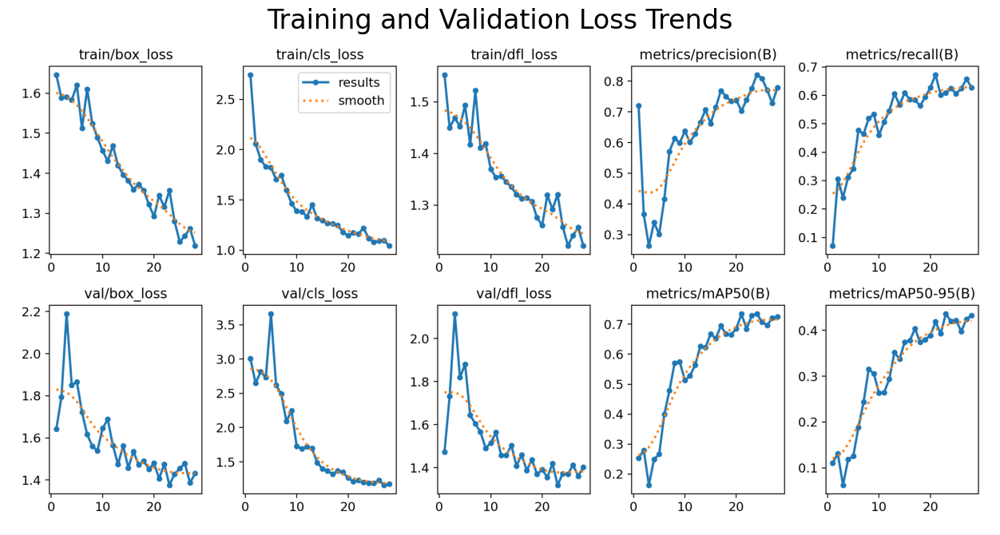

In [15]:
# Create the full file path by joining the directory path with the filename
results_file_path = os.path.join(post_train_files_path, 'results.png')

# Read the image using cv2
image = cv2.imread(results_file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.figure(figsize=(18, 8))
plt.imshow(image)
plt.title('Training and Validation Loss Trends', fontsize=24)
plt.axis('off')
plt.show()

#### Precision Recall Curve

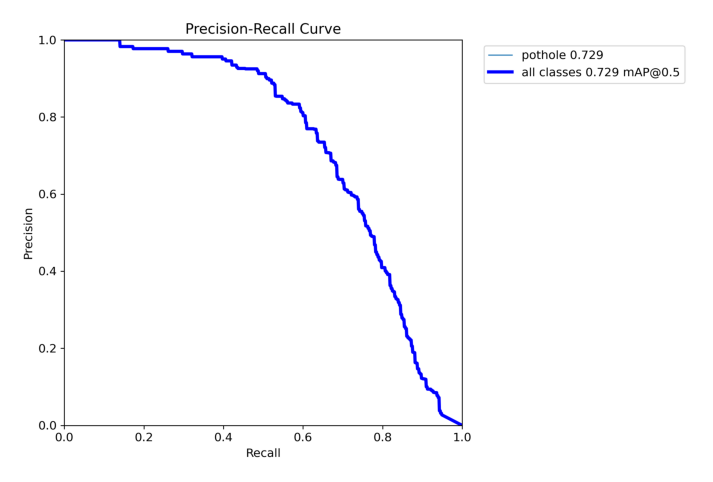

In [18]:
# Create the full file path by joining the directory path with the filename
results_file_path = os.path.join(post_train_files_path, 'PR_curve.png')

# Read the image using cv2
image = cv2.imread(results_file_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib
plt.figure(figsize=(15, 6))
plt.imshow(image)
#plt.title('Training and Validation Loss Trends', fontsize=24)
plt.axis('off')
plt.show()

**Observation**

* The Loss plots from above indicate a slight gap between train and vaidation values, hence model is slightly overfit. Needs improvement

* PR curve indicates a good balance of around 73%

* mean Average Precision is lower for IOU=50 to 90 compared to IOU=50 indicating room for improvement

### Detect potholes in Test images

We will load the best weights identified during training and use that to predict against few images in test dataset

In [19]:
# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_train_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

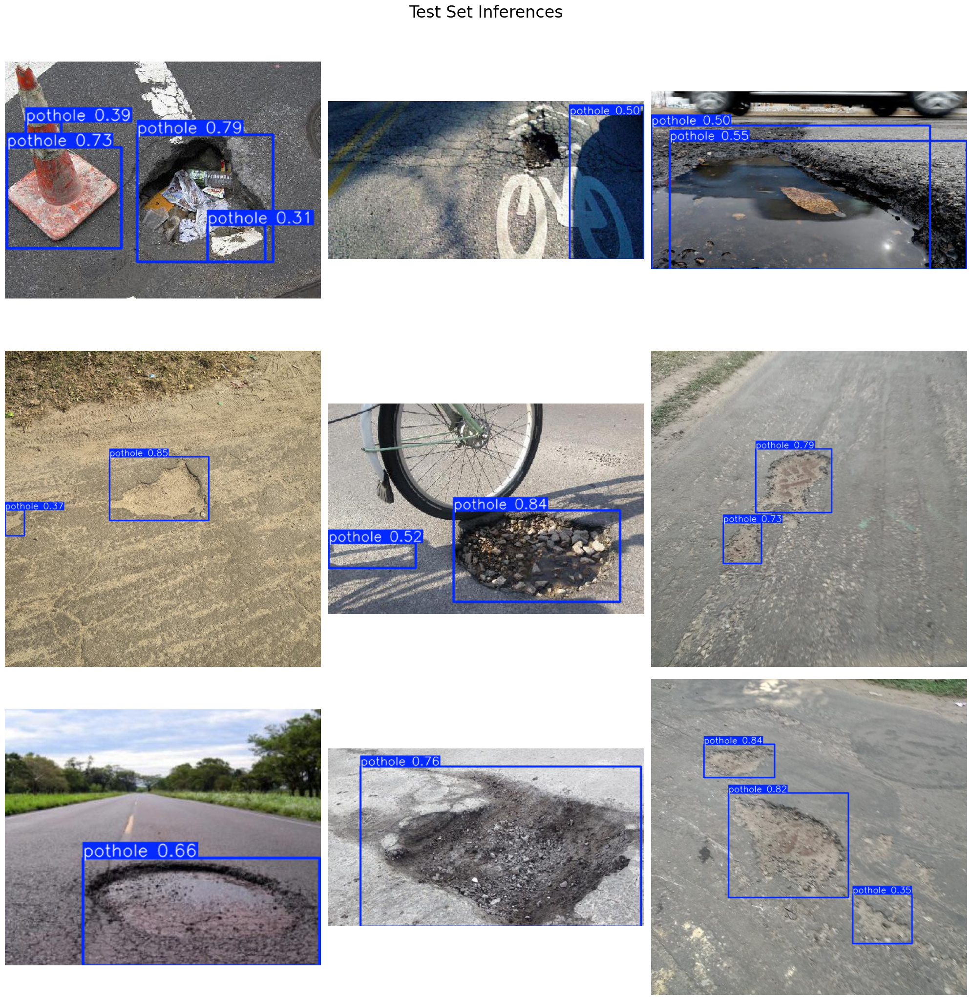

In [23]:
# Define the path to the validation images
valid_images_path = os.path.join(DATASET_PATH, 'test', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Test Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, verbose=False)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

### Conclusion
We have successfully trained a YOLOv11 model to detect potholes with a decent accuracy.

**Next steps**
* Provide examples of more street images to avoid misclassificaion of regular objects found on street like traffic cones, road-repair tools, etc
* Explore the annotation tools available to build a dataset with labels indicating severity of potholes
* Build an Image Segmentation dataset that can correctly identify the areas for repair in the model
* Geotagging the images for easy identification of potholes location